In [2]:
#!git clone https://github.com/milarobotlearningcourse/robot_learning_2025.git
%cd robot_learning_2025/hw2
!pip3 install -r requirements.txt
!pip3 install mediapy
# Install repo
import cv2
import tensorflow_datasets as tfds
import tqdm
import rlds, numpy as np
import mediapy as media
from PIL import Image
from IPython import display

[Errno 2] No such file or directory: 'robot_learning_2025/hw2'
/content/robot_learning_2025/hw2
  Using cached hydra_core-1.1.1-py3-none-any.whl.metadata (4.1 kB)
  Using cached omegaconf-2.1.2-py3-none-any.whl.metadata (3.6 kB)
  Using cached antlr4_python3_runtime-4.8-py3-none-any.whl
Using cached hydra_core-1.1.1-py3-none-any.whl (145 kB)
Using cached omegaconf-2.1.2-py3-none-any.whl (74 kB)
  Attempting uninstall: antlr4-python3-runtime
    Found existing installation: antlr4-python3-runtime 4.9.3
    Uninstalling antlr4-python3-runtime-4.9.3:
      Successfully uninstalled antlr4-python3-runtime-4.9.3
  Attempting uninstall: omegaconf
    Found existing installation: omegaconf 2.3.0
    Uninstalling omegaconf-2.3.0:
      Successfully uninstalled omegaconf-2.3.0
  Attempting uninstall: hydra-core
    Found existing installation: hydra-core 1.3.2
    Uninstalling hydra-core-1.3.2:
      Successfully uninstalled hydra-core-1.3.2


In [1]:
!pwd

/content


{'steps': <_VariantDataset element_spec={'action': {'open_gripper': TensorSpec(shape=(), dtype=tf.bool, name=None), 'rotation_delta': TensorSpec(shape=(3,), dtype=tf.float32, name=None), 'terminate_episode': TensorSpec(shape=(), dtype=tf.float32, name=None), 'world_vector': TensorSpec(shape=(3,), dtype=tf.float32, name=None)}, 'is_first': TensorSpec(shape=(), dtype=tf.bool, name=None), 'is_last': TensorSpec(shape=(), dtype=tf.bool, name=None), 'is_terminal': TensorSpec(shape=(), dtype=tf.bool, name=None), 'observation': {'image': TensorSpec(shape=(480, 640, 3), dtype=tf.uint8, name=None), 'natural_language_embedding': TensorSpec(shape=(512,), dtype=tf.float32, name=None), 'natural_language_instruction': TensorSpec(shape=(), dtype=tf.string, name=None), 'state': TensorSpec(shape=(7,), dtype=tf.float32, name=None)}, 'reward': TensorSpec(shape=(), dtype=tf.float32, name=None)}>}
Instruction: Place the can to the left of the pot.


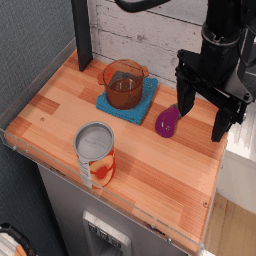

In [2]:
from PIL import Image
from IPython import display
def as_gif(images, path='temp.gif'):
  # Render the images as the gif:
  images = [Image.fromarray(image) for image in images]
  images[0].save(path, save_all=True, append_images=images[1:], duration=1000, loop=0)
  gif_bytes = open(path,'rb').read()
  return gif_bytes

# create RLDS dataset builder
builder = tfds.builder_from_directory(builder_dir='gs://gresearch/robotics/bridge/0.1.0/')
dataset = builder.as_dataset(split='train[:1]')

# sample episode + resize to 256x256 (default third-person cam resolution)
episode = next(iter(dataset))
print(episode)

steps = list(episode['steps'])
images = np.array([cv2.resize(np.array(step['observation']['image']), (256, 256)) for step in steps])

# extract goal image & language instruction
goal_image = images[-1]
language_instruction = steps[0]['observation']['natural_language_instruction'].numpy().decode()

# visualize episode
print(f'Instruction: {language_instruction}')
display.Image(as_gif(images))

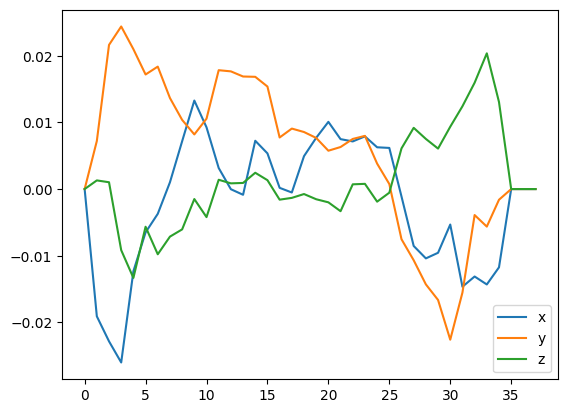

In [3]:
## Looking at the actions
import matplotlib.pyplot as plt

actions = np.array([np.array(step['action']['world_vector']) for step in steps])

plt.plot(actions[:, 0], label='x')
plt.plot(actions[:, 1], label='y')
plt.plot(actions[:, 2], label='z')
plt.legend()
plt.show()

In [4]:
## Install SimpleEnv for evaluation in the simulation
# @title Install vulkan for rendering
!apt-get install -yqq --no-install-recommends libvulkan-dev vulkan-tools
# below fixes some bugs introduced by some recent Colab changes
!mkdir -p /usr/share/vulkan/icd.d
!wget -q -P /usr/share/vulkan/icd.d https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/nvidia_icd.json
!wget -q -O /usr/share/glvnd/egl_vendor.d/10_nvidia.json https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/10_nvidia.json

Selecting previously unselected package libvulkan1:amd64.
(Reading database ... 124926 files and directories currently installed.)
Preparing to unpack .../libvulkan1_1.3.204.1-2_amd64.deb ...
Unpacking libvulkan1:amd64 (1.3.204.1-2) ...
Selecting previously unselected package libvulkan-dev:amd64.
Preparing to unpack .../libvulkan-dev_1.3.204.1-2_amd64.deb ...
Unpacking libvulkan-dev:amd64 (1.3.204.1-2) ...
Selecting previously unselected package vulkan-tools.
Preparing to unpack .../vulkan-tools_1.3.204.0+dfsg1-1_amd64.deb ...
Unpacking vulkan-tools (1.3.204.0+dfsg1-1) ...
Setting up libvulkan1:amd64 (1.3.204.1-2) ...
Setting up libvulkan-dev:amd64 (1.3.204.1-2) ...
Setting up vulkan-tools (1.3.204.0+dfsg1-1) ...
Processing triggers for libc-bin (2.35-0ubuntu3.8) ...
/sbin/ldconfig.real: /usr/local/lib/libtcm.so.1 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbbind_2_0.so.3 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libur_loader.so.0 is not a symboli

In [5]:
# @title Make sure vulkan is installed correctly
!vulkaninfo | head -n 5

'DISPLAY' environment variable not set... skipping surface info
error: XDG_RUNTIME_DIR not set in the environment.
VULKANINFO

Vulkan Instance Version: 1.3.204


In [6]:
!git clone https://github.com/milarobotlearningcourse/SimplerEnv.git --recurse-submodules
!pip install -e ./SimplerEnv/ManiSkill2_real2sim/
!pip install -e ./SimplerEnv
!mkdir ./SimplerEnv/checkpoints

Cloning into 'SimplerEnv'...
remote: Enumerating objects: 1570, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 1570 (delta 0), reused 1 (delta 0), pack-reused 1568 (from 1)
Receiving objects: 100% (1570/1570), 16.89 MiB | 21.29 MiB/s, done.
Resolving deltas: 100% (1104/1104), done.
Submodule 'ManiSkill2_real2sim' (https://github.com/simpler-env/ManiSkill2_real2sim) registered for path 'ManiSkill2_real2sim'
Cloning into '/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim'...
remote: Enumerating objects: 3451, done.        
remote: Counting objects: 100% (65/65), done.        
remote: Compressing objects: 100% (29/29), done.        
remote: Total 3451 (delta 49), reused 36 (delta 36), pack-reused 3386 (from 2)        
Receiving objects: 100% (3451/3451), 188.76 MiB | 34.52 MiB/s, done.
Resolving deltas: 100% (1833/1833), done.
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remo

In [11]:
import sys
sys.path.append('/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim/')
sys.path.append('/content/robot_learning_2025/hw2/SimplerEnv')
print(sys.path)

['/content', '/env/python', '/usr/lib/python311.zip', '/usr/lib/python3.11', '/usr/lib/python3.11/lib-dynload', '', '/usr/local/lib/python3.11/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.11/dist-packages/IPython/extensions', '/usr/local/lib/python3.11/dist-packages/setuptools/_vendor', '/root/.ipython', '/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim/', '/content/robot_learning_2025/hw2/SimplerEnv', '/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim/', '/content/robot_learning_2025/hw2/SimplerEnv']


In [12]:
import simpler_env

/usr/local/lib/python3.11/dist-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_language_instruction to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.get_language_instruction` for environment variables or `env.get_wrapper_attr('get_language_instruction')` that will search the reminding wrappers.
  logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/core.py:311: UserWarning: WARN: env.robot_uid to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.robot_uid` for environment variables or `env.get_wrapper_attr('robot_uid')` that will search the reminding wrappers.
  logger.warn(


Reset info {'scene_name': 'bridge_table_1_v1', 'scene_offset': None, 'scene_pose': None, 'scene_table_height': 0.87, 'urdf_version': '', 'rgb_overlay_path': '/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim/data/real_inpainting/bridge_real_eval_1.png', 'rgb_overlay_cameras': ['3rd_view_camera'], 'rgb_overlay_mode': 'background', 'disable_bad_material': False, 'episode_model_ids': ['bridge_carrot_generated_modified', 'bridge_plate_objaverse_larger'], 'episode_model_scales': [1.0, 1.0], 'episode_source_obj_name': 'bridge_carrot_generated_modified', 'episode_target_obj_name': 'bridge_plate_objaverse_larger', 'episode_source_obj_init_pose_wrt_robot_base': Pose([0.381995, 0.104536, 0.0175282], [-0.706719, 0.0305475, -0.0305745, -0.706173]), 'episode_target_obj_init_pose_wrt_robot_base': Pose([0.382, -0.047, -0.000468433], [-6.55451e-07, -5.10228e-07, -1.6917e-06, -1]), 'episode_id': 1}
Instruction put carrot on plate
Episode stats OrderedDict([('moved_correct_obj', False), ('

  if event.key is 'enter':



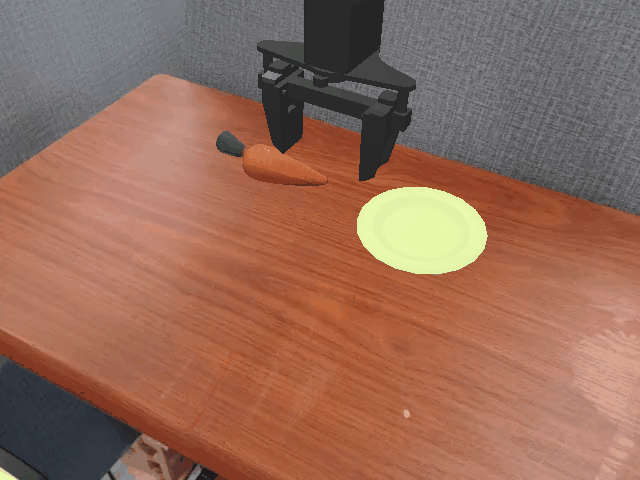

In [13]:
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
import mediapy
import sapien.core as sapien
import matplotlib.pyplot as plt

task_name = "widowx_carrot_on_plate"  # @param ["google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"]

if 'env' in locals():
  print("Closing existing env")
  env.close()
  del env
env = simpler_env.make(task_name)
# Colab GPU does not support denoiser
sapien.render_config.rt_use_denoiser = False
obs, reset_info = env.reset()
instruction = env.get_language_instruction()
print("Reset info", reset_info)
print("Instruction", instruction)

frames = []
done, truncated = False, False
while not (done or truncated):
   # action[:3]: delta xyz; action[3:6]: delta rotation in axis-angle representation;
   # action[6:7]: gripper (the meaning of open / close depends on robot URDF)
   image = get_image_from_maniskill2_obs_dict(env, obs)
   action = env.action_space.sample() # replace this with your policy inference
   obs, reward, done, truncated, info = env.step(action)
   frames.append(image)

episode_stats = info.get('episode_stats', {})
print("Episode stats", episode_stats)
# mediapy.show_video(frames, fps=10)
import moviepy.editor as mpy
clip = mpy.ImageSequenceClip(list(frames), fps=20)
display.Image(as_gif(frames))

In [2]:
from hydra import compose, initialize
initialize(config_path="./conf", job_name="test_app")

<ipython-input-2-eb7134265852>:2: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  initialize(config_path="./conf", job_name="test_app")


hydra.initialize()

In [ ]:
import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.optim import Adam
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader

import tensorflow_datasets as tfds
import numpy as np
from tqdm import tqdm, trange
import cv2


# data loading
def get_batch_grp(split, dataset, batch_size):
    # generate a small batch of inputs x and targets y
    data = dataset['train'] if split == 'train' else dataset['test']
    ix = np.random.randint(int(len(data["img"])), size=(batch_size,))
    x = torch.tensor(data["img"][ix], dtype=torch.float)
    x_goal = torch.tensor(data["goal"][ix], dtype=torch.long)
    x_goal_img = torch.tensor(data["goal_img"][ix], dtype=torch.float)
    y = torch.tensor(data["action"][ix], dtype=torch.float)
    return x, x_goal, x_goal_img, y


@torch.no_grad()
def estimate_loss(model):
    out = {}
    model.eval()
    for split in ['train', 'val']:
        losses = torch.zeros(model._cfg.eval_iters)
        for k in range(model._cfg.eval_iters):
            X, x_goal, x_goal_img, Y = get_batch_grp(split, model._dataset, model._cfg.batch_size)
            logits, loss = model(X, x_goal, x_goal_img, Y)
            losses[k] = loss.item()
        out[split] = losses.mean()
    model.train()
    return out

def get_patches_fast(images):
    from einops import rearrange
    batch_size, channels, height, width = images.shape
    patch_size = height // 8 ## n_patches = 8

    patches = rearrange(images, 'b (h p1) (w p2) c -> b (h w) (p1 p2 c)', p1 = patch_size, p2 = patch_size)
    return patches

def calc_positional_embeddings(sequence_length, d):
    result = torch.ones(sequence_length, d)
    for i in range(sequence_length):
        for j in range(d):
            result[i][j] = np.sin(i / (10000 ** (j / d))) if j % 2 == 0 else np.cos(i / (10000 ** ((j - 1) / d)))
    return result

## This is an encoder head (full attention)
class Head(nn.Module):
    """ one head of self-attention """

    def __init__(self, head_size, n_embd, dropout):
        super().__init__()
        self.key = nn.Linear(n_embd, head_size, bias=False)
        self.query = nn.Linear(n_embd, head_size, bias=False)
        self.value = nn.Linear(n_embd, head_size, bias=False)
        # self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))

        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        B,T,C = x.shape
        TODO
        k = self.key(x)   # (B,T,C)
        q = self.query(x) # (B,T,C)
        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2,-1) * C**-0.5 # (B, T, C) @ (B, C, T) -> (B, T, T)
        ### Block masked attention
        wei = wei.masked_fill(mask == 0, float('-inf')) # (B, T, T)
        wei = F.softmax(wei, dim=-1) # (B, T, T)
        wei = self.dropout(wei)
        # perform the weighted aggregation of the values
        v = self.value(x) # (B,T,C)
        out = wei @ v # (B, T, T) @ (B, T, C) -> (B, T, C)
        return out

class MultiHeadAttention(nn.Module):
    """ multiple heads of self-attention in parallel """

    def __init__(self, num_heads, head_size, n_embd, dropout):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size, n_embd=n_embd, dropout=dropout) for _ in range(num_heads)])
        self.proj = nn.Linear(n_embd, n_embd)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        out = torch.cat([h(x, mask) for h in self.heads], dim=-1)
        out = self.dropout(self.proj(out))
        return out

class FeedFoward(nn.Module):
    """ a simple linear layer followed by a non-linearity """

    def __init__(self, n_embd, dropout):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_embd, 4 * n_embd),
            nn.ReLU(),
            nn.Linear(4 * n_embd, n_embd),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x,)

class Block(nn.Module):
    """ Transformer block: communication followed by computation """

    def __init__(self, n_embd, n_head, dropout):
        # n_embd: embedding dimension, n_head: the number of heads we'd like
        super().__init__()
        head_size = n_embd // n_head
        self.sa = MultiHeadAttention(n_head, head_size, n_embd=n_embd, dropout=dropout)
        self.ffwd = FeedFoward(n_embd, dropout)
        self.ln1 = nn.LayerNorm(n_embd)
        self.ln2 = nn.LayerNorm(n_embd)

    def forward(self, x, mask=None):
        x = x + self.sa(self.ln1(x), mask)
        x = x + self.ffwd(self.ln2(x))
        return x

class GRP(nn.Module):
  def __init__(self, dataset, cfg, mlp_ratio=4):
    super(GRP, self).__init__()
    self._dataset = dataset
    self._cfg = cfg
    TODO

  def _init_weights(self, module):
      if isinstance(module, nn.Linear):
          torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
          if module.bias is not None:
              torch.nn.init.zeros_(module.bias)
      elif isinstance(module, nn.Embedding):
          torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)

  def forward(self, images, goals_txt, goal_imgs, targets=None):
    # Dividing images into patches
    n, c, h, w = images.shape
    B, T = goals_txt.shape
    TODO

import hydra, json
from omegaconf import DictConfig, OmegaConf
from hydra import compose, initialize

# @hydra.main(config_path="conf", config_name="grp-mini")
# @hydra.main(config_path="./conf", config_name="bridge-64-light")
def my_main():
    cfg = compose(config_path="./conf", config_name="bridge-64-light", overrides=["+env=absolute_path"])

    torch.manual_seed(cfg.r_seed)
    print ("cfg:", OmegaConf.to_yaml(cfg))
    torch.manual_seed(cfg.r_seed)
    log_dir = hydra.core.hydra_config.HydraConfig.get().runtime.output_dir
    print ("cfg:", OmegaConf.to_yaml(cfg))
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print("Using device: ", device, f"({torch.cuda.get_device_name(device)})" if torch.cuda.is_available() else "")
    cfg.device = device
    from datasets import load_dataset, load_from_disk

    dataset = load_dataset(cfg.dataset.to_name, split='train')
    print('Features:', dataset.features)

    dataset_tmp = {
        "img": np.array(dataset["img"]),
        "action": np.concatenate((np.array(dataset["action"])
                                ,np.array(dataset["rotation_delta"])
                                ,np.array(dataset["open_gripper"])
                                ), axis=1),
        "goal_img": np.array(dataset["goal_img"]),
        "goal": dataset["goal"]
    }
    shortest_text_len = min([len(txt) for txt in dataset["goal"]])
    cfg.block_size = shortest_text_len

    # here are all the unique characters that occur in this text
    chars = sorted(list(set([item for row in dataset_tmp["goal"] for item in row]))) ## Flatten to a long string
    cfg.vocab_size = len(chars)
    # create a mapping from characters to integers
    stoi = { ch:i for i,ch in enumerate(chars) }
    itos = { i:ch for i,ch in enumerate(chars) }
    encode_txt = lambda s: [stoi[c] for c in s] # text encoder to tokens:
    decode_txy = lambda l: ''.join([itos[i] for i in l]) # token decoder to text:
    print("vocab_size:", cfg.vocab_size)
    print("example text encode:", encode_txt(dataset_tmp["goal"][0]))

    TODO

    ## Get the actions and encode them to map to [-1, 1]
    encode_state = lambda af:   ((af/(255.0)*2.0)-1.0).astype(np.float32) # encoder: take a float, output an integer
    resize_state = lambda sf:   cv2.resize(np.array(sf, dtype=np.float32), (cfg.image_shape[0], cfg.image_shape[1]))  # resize state

    dataset_tmp = {
        "img": torch.tensor(encode_state(dataset_tmp["img"])).to(device),
        "action": torch.tensor(encode_action(dataset_tmp["action"]), dtype=torch.float).to(device),
        "goal_img": torch.tensor(encode_state(dataset_tmp["goal_img"])).to(device),
        "goal": torch.tensor([encode_txt(goal[:cfg.block_size]) for goal in dataset_tmp["goal"]]).to(device)
    }

    print("Dataset shape:", len(dataset_tmp["img"]))
    dataset_tmp = {"train": dataset_tmp, "test": dataset_tmp}
    if not cfg.testing:
        import wandb
        # start a new wandb run to track this script
        wandb.init(
            # set the wandb project where this run will be logged
            project=cfg.experiment.project,

            # track hyperparameters and run metadata
            config= OmegaConf.to_container(cfg)
        )
        wandb.run.log_code(".")
    model = GRP(dataset_tmp, cfg)
    m = model.to(device)
    print(sum(p.numel() for p in m.parameters())/1e6, 'M parameters')

    # create a PyTorch optimizer
    optimizer = torch.optim.AdamW(model.parameters(), lr=cfg.learning_rate)
    import torch.optim.lr_scheduler as lr_scheduler
    scheduler = lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=cfg.max_iters)

    if cfg.simEval:
        import simpler_env
        from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
        task_name = "widowx_carrot_on_plate"  # @param ["google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"]
        if 'env' in locals():
            print("Closing existing env")
            env.close()
            del env
        env = simpler_env.make(task_name)
        env_unwrapped = env.env.env.env ## Updated gymnasium wrapper adds lots of wrappers.

    for iter in range(cfg.max_iters):

        if iter % cfg.eval_interval == 0 or iter == cfg.max_iters - 1:
            losses = estimate_loss(model)
            print(f"step {iter}: train loss {losses['train']:.4f}, val loss {losses['val']:.4f}")
            if not cfg.testing:
                wandb.log({"train loss": losses['train'], "val loss": losses['val']})

            if cfg.simEval and (iter % cfg.eval_vid_iters == 0): ## Do this eval infrequently because it takes a fiar bit of compute
                rewards = []
                for j in range(cfg.sim.eval_episodes): ## Better to eval over a few different goal configurations
                    obs, reset_info = env.reset()
                    instruction = env_unwrapped.get_language_instruction()
                    print("Reset info", reset_info)
                    print("Instruction", instruction)
                    frames = []
                    done, truncated, timeLimit, t = False, False, 100, 0
                    while not (done or truncated or (t > timeLimit)):
                        # action[:3]: delta xyz; action[3:6]: delta rotation in axis-angle representation;
                        # action[6:7]: gripper (the meaning of open / close depends on robot URDF)
                        image = get_image_from_maniskill2_obs_dict(env_unwrapped, obs)
                        image = image[:,:,:3] ## Remove last dimension of image color
                        action, loss = model.forward(torch.tensor(np.array([encode_state(resize_state(image))])).to(device)
                                            ,torch.tensor(np.array([encode_txt(instruction)[:cfg.block_size]])).to(device) ## There can be issues here if th text is shorter than any example in the dataset
                                            ,torch.tensor(np.array([encode_state(resize_state(image))])).to(device) ## Not the correct goal image... Should mask this.
                                            )
                        # action = env.action_space.sample() # replace this with your policy inference
                        if cfg.load_action_bounds:
                            action = decode_action(action.cpu().detach().numpy()[0]) ## Add in the gripper close action
                        else:
                            action = np.concatenate((decode_action(action.cpu().detach().numpy()[0]), [0]), axis = -1) ## Add in the gripper close action
                        obs, reward, done, truncated, info = env.step(action)
                        reward = -np.linalg.norm(info["eof_to_obj1_diff"])
                        frames.append(image)
                        rewards.append(reward)
                        t=t+1

                episode_stats = info.get('episode_stats', {})
                print("Episode stats", episode_stats)
                print(f"avg reward {np.mean(rewards):.8f}")
                if not cfg.testing:
                    wandb.log({"avg reward": np.mean(rewards)})
                import moviepy.editor as mpy
                clip = mpy.ImageSequenceClip(list(frames), fps=20)
                clip.write_videofile(log_dir+"/sim-env-"+str(iter)+".mp4", fps=20)
                if not cfg.testing:
                    wandb.log({"example": wandb.Video(log_dir+"/sim-env-"+str(iter)+".mp4")})

        # sample a batch of data
        xb, xg, xgi, yb = get_batch_grp('train', dataset_tmp, cfg.batch_size)

        # evaluate the loss
        logits, loss = model(xb, xg, xgi, yb)
        loss.backward()

        if (iter + 1) % cfg.gradient_accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad(set_to_none=True)

    if not cfg.testing:
        wandb.finish()
    return losses['val']

if __name__ == "__main__":
    results = my_main()
    print("results:", results)
